![TMC_LOGO](https://docs.google.com/uc?export=download&id=16gkSEgU_fmRg4Jy0_ixMTuzMz0vLffEP)

# Let's play with convolutions! 
#**Build and train a Neural Network in 45 minutes.**
#### April 15th, 2021
### Daniel Eiroa





## **Introduction**

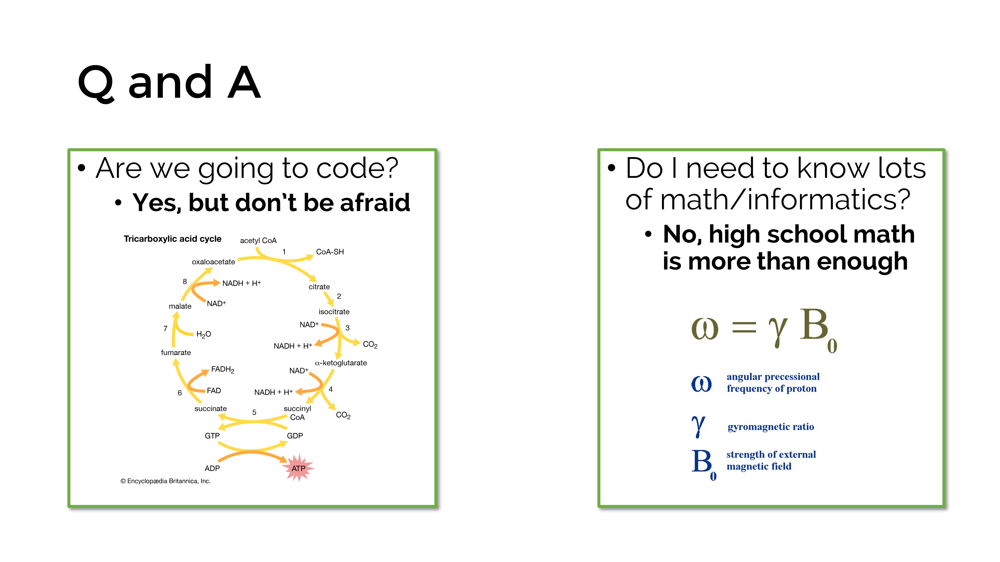

### Objectives
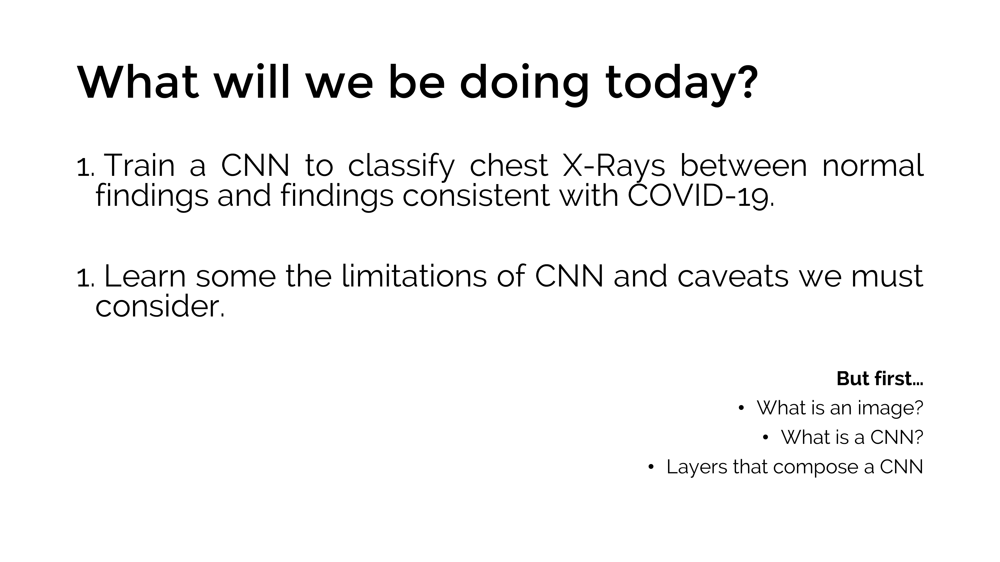

### What is an image?


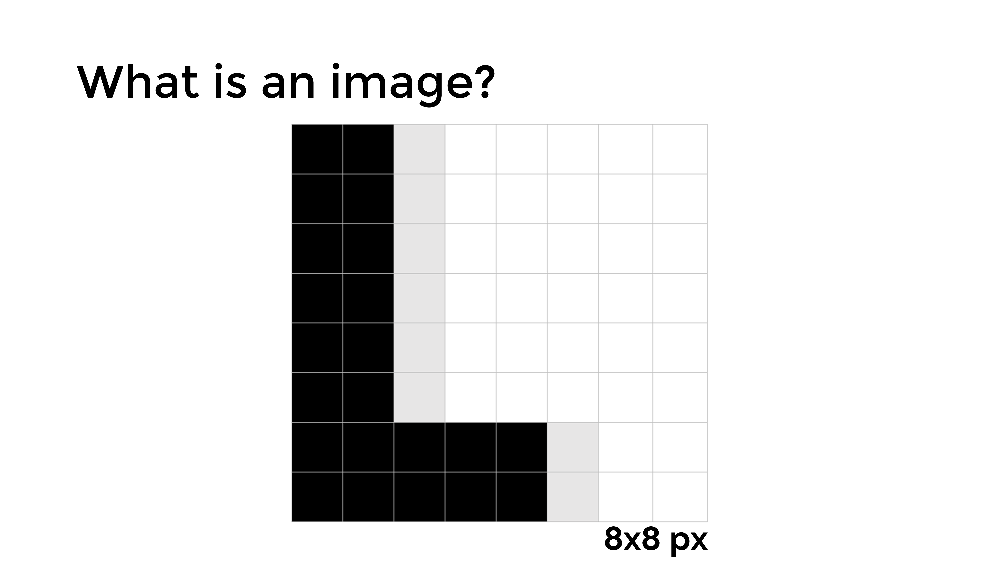

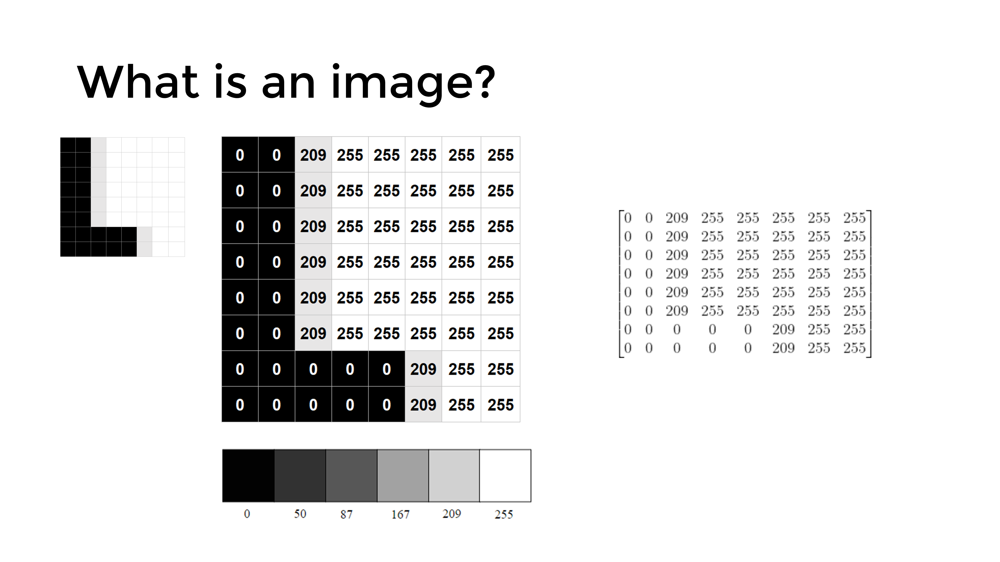

### What is a Convolutional Neural Network (CNN)?

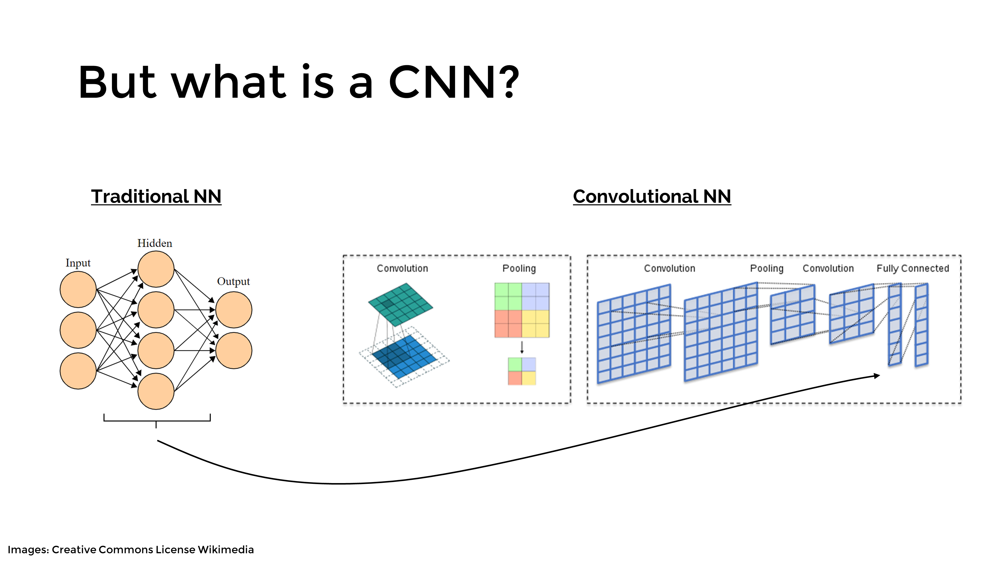

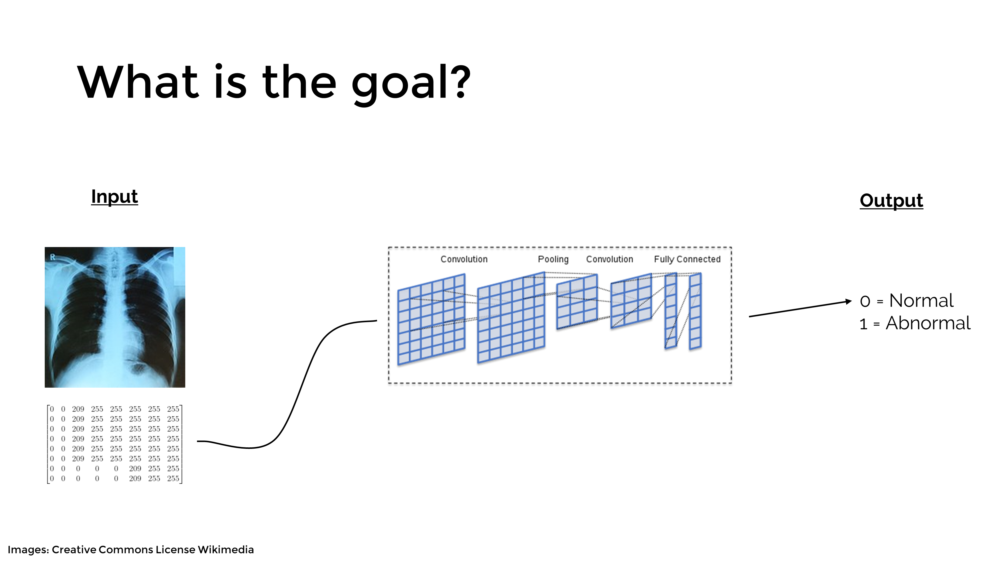

#### Convolutional layers

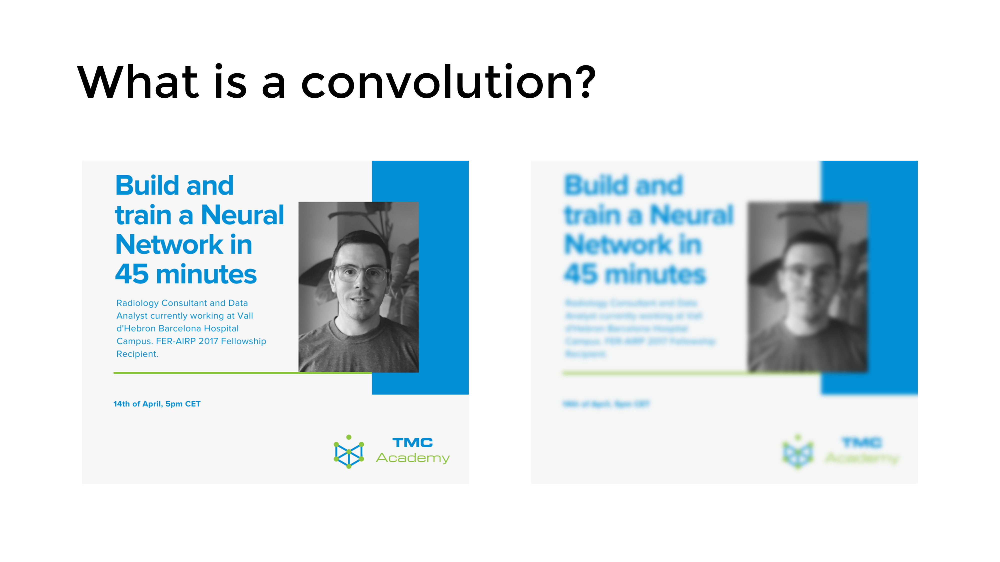

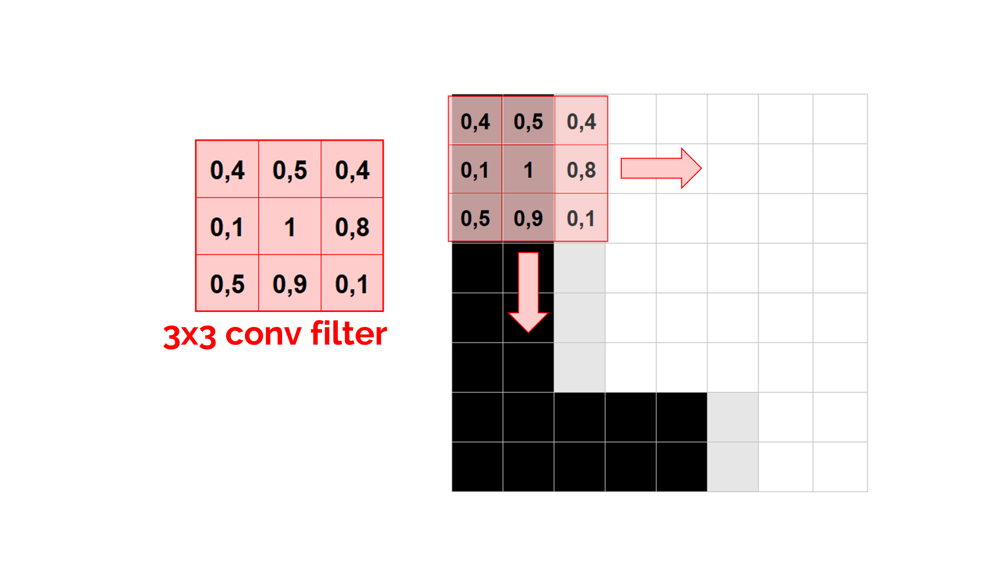

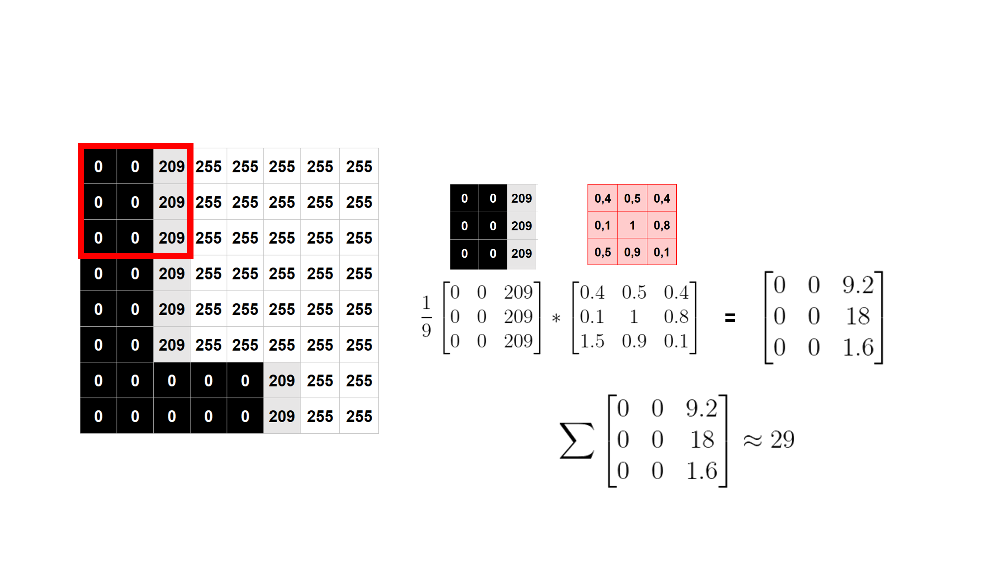

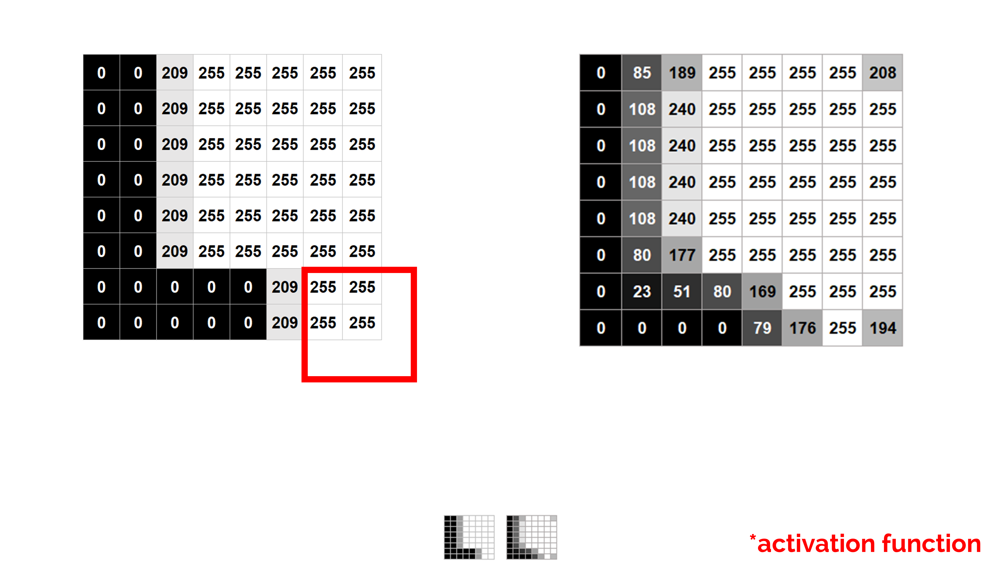

#### Pooling layers

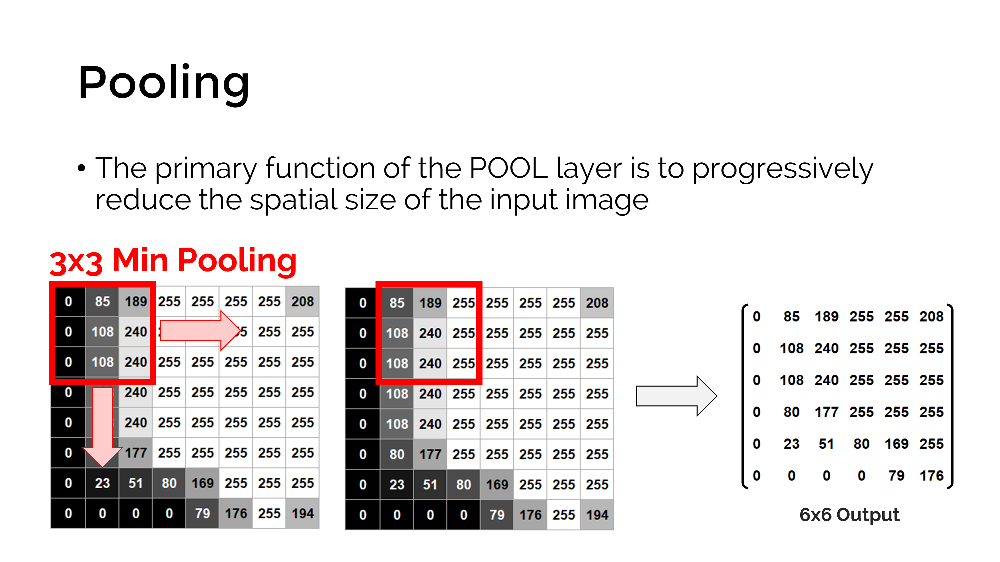

## Step 0. Getting this notebook ready to work

### Constants

#### System Constants and Image Download

In [ ]:
import os
ROOT = os.getcwd()
RESULTS = os.path.join(ROOT, 'results.model')
PLOT = os.path.join(ROOT, 'plot.png')
!wget --no-check-certificate "https://docs.google.com/uc?export=download&id=1ScZBmcA3HPMerD5FyVyLOjGNNsRQ6ud7" -O ./dataset_global.zip
!unzip -q "./dataset_global.zip"
DATA = "/content/dataset"
print("[NOTICE]: The global dataset has been downloaded.")  

#### NN Constants

In [ ]:
LR = 1e-3 # Initial learning rate
EPOCHS = 25
BS = 8 #Batch size

###Imports

#### General Imports

Libraries that will help with file and image manipulation, plotting, and general management.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from imutils import paths
import cv2
from google.colab.patches import cv2_imshow
import os
import datetime

#### TensorFlow and Keras Imports

Specific modules from Keras, one of the main libraries for Deep Learning, which is now included in TensorFlow 2.0

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import TensorBoard

#### Sklearn Imports

Tools from Scikit-learn, the gold standard of Machine Learning libraries, both to manipulate the labels or categories (`LabelBinarizer`) and to evaluate the results of our model.

In [ ]:
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

#### Tensorboard setup

In [ ]:
root_logdir = os.path.join(os.curdir, "my_logs")

def get_run_logdir():
  import time
  run_id = time.strftime("run_%Y_%m_%d-%H_%M_%S")
  return os.path.join(root_logdir, run_id)

run_logdir = get_run_logdir()

tensorboard_cb = TensorBoard(log_dir=run_logdir, histogram_freq=1)

## 1️⃣ **Step 1. What problem do you want to solve?**


* Define the objective.
  * Detecting COVID-19 in CXR
* How should performance be measured?
  * Accuracy. Confusion matrix
* Is the performance measure aligned with the objective?
* **Is human expertise available?**
* How would you solve the problem manually?

## 2️⃣ **Step 2. Gather your Dataset**



* I have already done that for you a few cells above.
* Here is a sample of the images selected:

![image_sample](https://www.pyimagesearch.com/wp-content/uploads/2020/03/covid19_keras_dataset.png)

_Source_: Reference 4.

## 3️⃣ **Step 3. Prepare the data and Split the Dataset**

### Loading and Preprocessing the Images

In [ ]:
img_paths = list(paths.list_images(DATA)) #Creates a list with the paths for every file

In [ ]:
# Two empty lists. images will contain the images as arrays of numbers and labels will contain the labels for each of the images
images = []
labels = []

In [ ]:
for img_path in img_paths: # for each of the image paths in the list img_paths:
	label = img_path.split(os.path.sep)[-2] # use the folder in which the file is contained as the label.
	image = cv2.imread(img_path) # load the image
	image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # change the color channels.
	image = cv2.resize(image, (224, 224)) # resize the image to 224x224, ignoring aspect ratio.
	images.append(image) # add the image to the images list.
	labels.append(label) # add the label to the labels list.

images = np.array(images) / 255.0 # convert the images list to a NumPy array and scale it to 0-1.
labels = np.array(labels) # convert the labels list to a NymPy array.

### One-Hot-Encoding of the labels

In [ ]:
labels

In [ ]:
lb = LabelBinarizer()
labels = lb.fit_transform(labels)
labels

In [ ]:
labels = to_categorical(labels)

### Train-Test Split

We will now perform a random separation of our data.
- 80% will be used for training.
- 20% will be used for testing the performance of the model.

To make sure that the proportions among the labels are  met, we stratified the randomization by label.

In [ ]:
images_train, images_test, labels_train, labels_test = train_test_split(images, labels, test_size=0.20, stratify=labels, random_state=42)

### Creating a Data Augmentation Helper

If we introduce some variations to the original images, we will be providing the network with different examples. This will help to find more general patterns in the images, thus avoiding "memorization" of the given images. Ultimately, this will make the neural network capable of generalizing its predictions on previously unseen examples.



In [ ]:
train_aug = ImageDataGenerator(
	rotation_range=15,
	fill_mode="nearest")

## 4️⃣ **Step 4. Train your network**
*If the data is huge, you may want to sample smaller training sets so you can train many different models in a reasonable time.*

### Initializing Pre-Trained Neural Network - VGG16

We first load the pre-trained VGG16 networks. The parameter  `include_top=False` makes sure that the final layers of the pre-trained model are not loaded. We will later *customize* those final layers and place them on top of the base model.
![VGG16 Architecture](https://miro.medium.com/max/940/1*3-TqqkRQ4rWLOMX-gvkYwA.png)

In [ ]:
base_model = VGG16(weights="imagenet", include_top=False,
	input_tensor=Input(shape=(224, 224, 3)))

We create the last layers of our own NN, that will run right after the base model.

In [ ]:
head_model = base_model.output
head_model = AveragePooling2D(pool_size=(4, 4))(head_model)
head_model = Flatten(name="flatten")(head_model)
head_model = Dense(64, activation="relu")(head_model)
head_model = Dropout(0.5)(head_model)
head_model = Dense(2, activation="softmax")(head_model)

Finally, we construct the final model, which consists of a concatenation of the pre-trained base model and our custom final layers

In [ ]:
model = Model(inputs=base_model.input, outputs=head_model)

After the final model is ensembled we loop over the layers of the pre-trained base model and set them to `not trainable` in order to preserve the pre-trained weights and avoid them being updated during the training process:

In [ ]:
for layer in base_model.layers:
	layer.trainable = False

We can use the `plot_model` function from the keras library `utils` class to get a visual summary of our network

In [ ]:
plot_model(model, to_file=ROOT+"/model_arch.png", show_shapes=True, show_layer_names=False)

### Compiling our model

#### Setting up the optimizer

We will use the Adam (Adaptive Moment Estimation) optimizer. Adam is an adaptive learning rate method, which means, it computes individual learning rates for different parameters. 

In [ ]:
optimizer = Adam(lr=LR, decay=LR / EPOCHS)

#### Model compilation

We use `binary_crossentropy` as the loss function, the optimizer we just initialized above, and accuracy as the metric to monitor the training (our classes are balanced, so accuracy is a suitable metric in this case).

In [ ]:
model.compile(loss="binary_crossentropy", 
              optimizer=optimizer, 
              metrics=["accuracy"])

### Training the Model

Remember that, as we set the layers of the base model as non trainable, only the weights of the head model (i.e. our custom layers) will be updated during the training process.

In [ ]:
H = model.fit(
    train_aug.flow(images_train, labels_train, batch_size=BS), 
    steps_per_epoch=len(images_train) // BS, 
    validation_data=(images_test, labels_test),
    validation_steps=len(images_test) // BS, epochs=EPOCHS,
    callbacks=[tensorboard_cb])

## 5️⃣ **Step 5. Evaluate your network**
+ Once you are confident about your final model, measure its performance on the test set to estimate the generalization error.

*Don't tweak your model after measuring the generalization error: you would just start overfitting the test set.*

We first make predictions using the Test Set

In [ ]:
preds = model.predict(images_test, batch_size=BS)
preds

Then, for each image in the Test Set, we need to find the index of the label with corresponding largest predicted probability

In [ ]:
preds = np.argmax(preds, axis=1)
preds

In [ ]:
labels_test.argmax(axis=1)

Lastly, we compare, for each label index, the real label with the prediction that our model makes, and show it correctly formatted.

In [ ]:
print(classification_report(labels_test.argmax(axis=1), 
                            preds,
                            target_names=lb.classes_))

As health professionals, we are more used to interpret the results in terms of True Positives, True Negatives, Sensitivity, etc. So a confusion matrix may come in handy for these cases.

In the next cell code for creating a confusion matrix as well as better known (at least for us doctors) metrics.

In [ ]:
cm = confusion_matrix(labels_test.argmax(axis=1), preds)
total = sum(sum(cm))
acc = (cm[0, 0] + cm[1, 1]) / total
sensitivity = cm[0, 0] / (cm[0, 0] + cm[0, 1])
specificity = cm[1, 1] / (cm[1, 0] + cm[1, 1])
ppv = cm[0, 0] / (cm[0, 0] + cm[1, 0])
npv = cm[1, 1] / (cm[1, 1] + cm[0, 1])
# show the confusion matrix, accuracy, sensitivity, and specificity
print(cm)
print(f"acc: {acc:.4f}")
print(f"sensitivity: {sensitivity:.4f}")
print(f"specificity: {specificity:.4f}")
print(f"positive pred value: {ppv:.4f}")
print(f"negative pred value: {npv:.4f}")

In [ ]:
cmdf = pd.DataFrame(cm, columns=['cov_pred', 'norm_pred'], index=['cov_real', 'norm_real'])
cmdf

But we, as radiologists, know that an image is worth a thousand words. So, in the next cell we use the `TensorBoard` extension to plot the Train and Test **loss** and **accuracy** throughout the epochs.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=./my_logs --port=6006

In [ ]:
print("[INFO] saving COVID-19 detector model...")
model.save(RESULTS, save_format="h5")

## 📚 **References**
---
1. [Deep Learning for Computer Vision with Python | Adrian Rosebrock](https://www.pyimagesearch.com/deep-learning-computer-vision-python-book/)
2. [Hands-on Machine Learning with Scikit-Learn, Keras and TensorFlow | Aurélien Géron](https://github.com/ageron/handson-ml2)
3. [A Comprehensive Guide to Convolutional Neural Networks — the ELI5 way | Sumit Saha](https://towardsdatascience.com/a-comprehensive-guide-to-convolutional-neural-networks-the-eli5-way-3bd2b1164a53)
4. [Detecting COVID-19 in X-ray images with Keras, TensorFlow, and Deep Learning | Adrian Rosebrock](https://www.pyimagesearch.com/2020/03/16/detecting-covid-19-in-x-ray-images-with-keras-tensorflow-and-deep-learning/)
5. [Keras learning rate schedules and decay | pyimagesearch](https://www.pyimagesearch.com/2019/07/22/keras-learning-rate-schedules-and-decay/)
6. [Gentle Introduction to the Adam Optimization Algorithm for Deep Learning | Machine Learning Mastery](https://machinelearningmastery.com/adam-optimization-algorithm-for-deep-learning/)
7. [Model plotting utilities | Keras API reference](https://keras.io/api/utils/model_plotting_utils/)